In [ ]:
import os
os.chdir("/content/drive/MyDrive/Pengolahan Citra")

# 0️⃣ Image Read and Write 🖼️

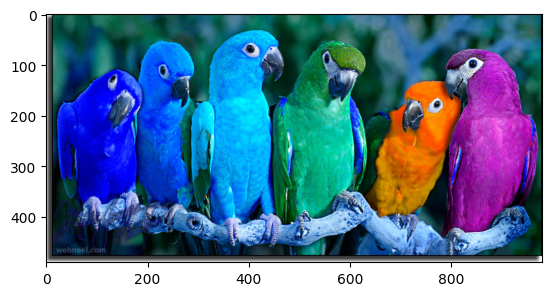

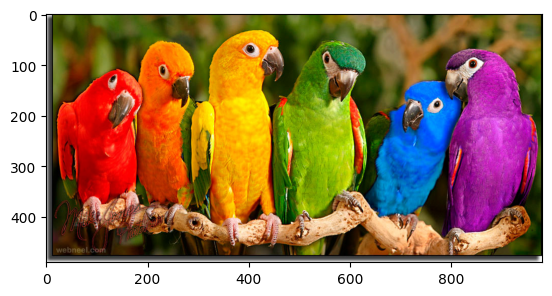

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

img = cv2.imread('./birds.jpg') # elephant
plt.imshow(img)
plt.show()

img_bgr = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.imshow(img_bgr)
plt.show()

# 1️⃣ Draw Geometrics 🔶 🟣

array([[[255, 105, 180],
        [255, 105, 180],
        [255, 105, 180],
        ...,
        [255, 105, 180],
        [255, 105, 180],
        [255, 105, 180]],

       [[255, 105, 180],
        [255, 105, 180],
        [255, 105, 180],
        ...,
        [255, 105, 180],
        [255, 105, 180],
        [255, 105, 180]],

       [[255, 105, 180],
        [255, 105, 180],
        [255, 105, 180],
        ...,
        [255, 105, 180],
        [255, 105, 180],
        [255, 105, 180]],

       ...,

       [[255, 105, 180],
        [255, 105, 180],
        [255, 105, 180],
        ...,
        [255, 105, 180],
        [255, 105, 180],
        [255, 105, 180]],

       [[255, 105, 180],
        [255, 105, 180],
        [255, 105, 180],
        ...,
        [255, 105, 180],
        [255, 105, 180],
        [255, 105, 180]],

       [[255, 105, 180],
        [255, 105, 180],
        [255, 105, 180],
        ...,
        [255, 105, 180],
        [255, 105, 180],
        [255, 105, 180]]], dtype=uint8)
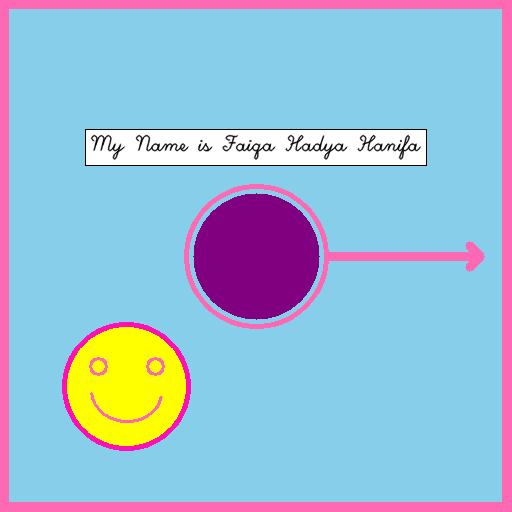

In [ ]:
# Create a black image and load any image to draw 512x512 dimension and 3 channels color
img_geo = np.zeros((512,512,3), np.uint8)

# set blue channel
img_geo[:,:,0] = 135  # Red channel
img_geo[:,:,1] = 206  # Green channel
img_geo[:,:,2] = 235  # Blue channel

# Calculate the center of the image
center_x = img_geo.shape[1] // 2
center_y = img_geo.shape[0] // 2

# Outline the base box
# Rectangle
img_geo = cv2.rectangle(img_geo, (510,0), (0,510), (255, 105, 180), 15)

# Circle: center coordinate and radius
img_geo = cv2.circle(img_geo, (center_x, center_y), 63, (128,0,128), -2)
cv2.circle(img_geo, (center_x, center_y), 70, (255, 105, 180), 3)

# Arrow
img_geo = cv2.arrowedLine(img_geo, (center_x + 72, center_y), (480, center_y), (255, 105, 180), 8)

# Smiley face
# Draw the smiley face at the center position
cv2.circle(img_geo, (center_x - 130, center_y + 130), 60, (255, 255, 0), -1)  # face
cv2.circle(img_geo, (center_x - 130, center_y + 130), 62, (255, 15, 180), 3)  # outline the face
cv2.circle(img_geo, (center_x - 158, center_y + 110), 8, (255, 105, 180), 2)  # left eye
cv2.circle(img_geo, (center_x - 101, center_y + 110), 8, (255, 105, 180), 2)  # right eye
cv2.ellipse(img_geo, (center_x - 130, center_y + 135), (35, 30), 5, 5, 170, (255, 105, 180), 2)  # mouth

# Box Text
font = cv2.FONT_HERSHEY_SCRIPT_SIMPLEX
text = 'My Name is Faiqa Hadya Hanifa'
text_size = cv2.getTextSize(text, font, 0.7, 1)[0]
text_width, text_height = text_size[0], text_size[1]
# Calculate the position of the text
text_x = (img_geo.shape[1] - text_width) // 2
text_y = 150
# Draw a rectangle around the text
cv2.rectangle(img_geo, (text_x - 5, text_y - text_height - 5), (text_x + text_width + 5, text_y + 15), (255, 255, 255), -1)  # white rectangle
cv2.rectangle(img_geo, (text_x - 5, text_y - text_height - 5), (text_x + text_width + 5, text_y + 15), (0, 0, 0), 1)    # black outline

# put text
cv2.putText(img_geo, text, (text_x, text_y), font, 0.7, (0,0,0), 1, cv2.LINE_AA)

# 2️⃣ Morphological Operations 🌀

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import cv2
from skimage.io import imread
from imageio import imread
from google.colab.patches import cv2_imshow

<ipython-input-333-26bdf76a0bac>:3: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img_gray = np.array(imread("./birds.jpg", mode = 'L'))


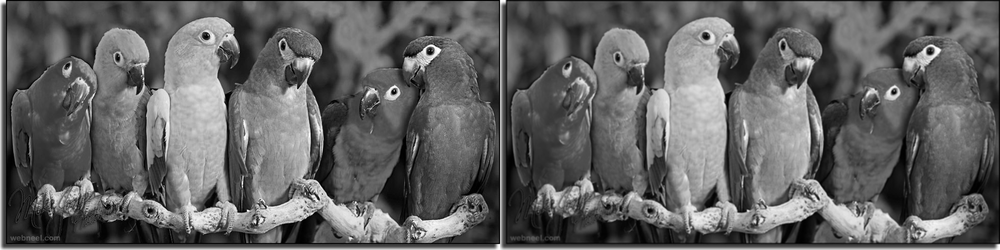

In [ ]:
# Blurring: low pass filter
# read image in grayscale
img_gray = np.array(imread("./birds.jpg", mode = 'L'))
# define kernel and normalization
kernel_3 = np.ones((3,3), np.float32) / 9.0
# apply convolution
img_kernel_3 = cv2.filter2D(img_gray, -1, kernel_3)
# concatenate image horizontally
list_img = np.hstack([img_gray, img_kernel_3])
# display the concatenated image
cv2_imshow(list_img)

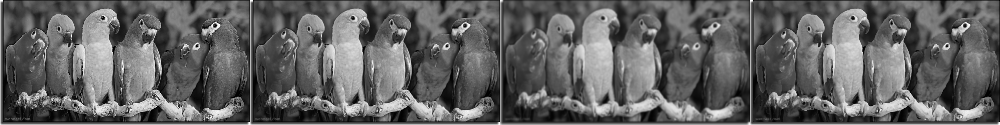

In [ ]:
# inbuilt blur functions
img_blur = cv2.blur(img_gray, (3,3))
img_gaussblur = cv2.GaussianBlur(img_gray, (15,15), 0) # must be odd integers
img_medianblur = cv2.medianBlur(img_gray, 5) # nust be an odd number
# concatenate
list_img_pt2 = np.hstack([img_gray, img_blur, img_gaussblur, img_medianblur])
cv2_imshow(list_img_pt2)

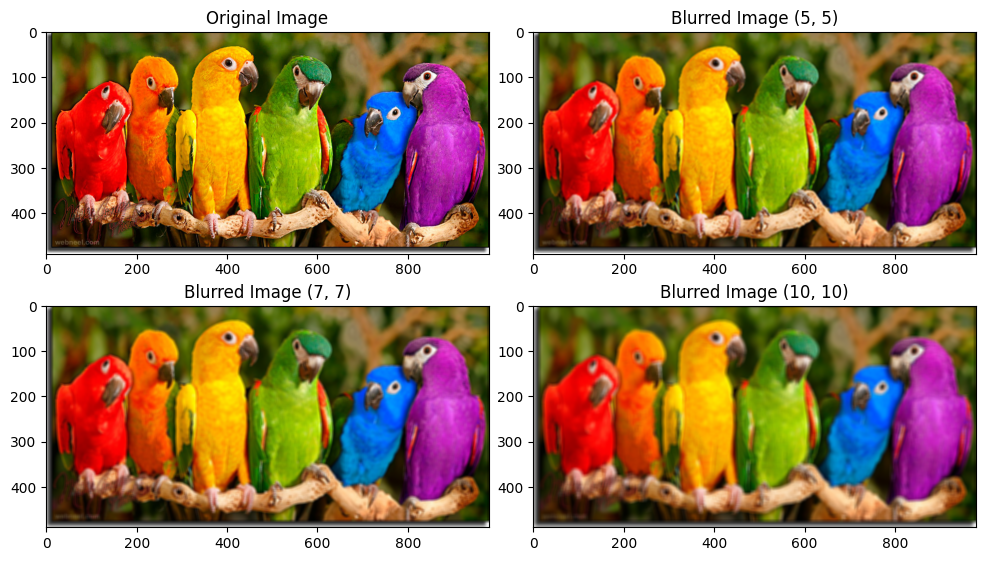

In [ ]:
## BLUR
# Create a figure to contain the subplots
fig = plt.figure(figsize=(12, 8))

# Display the original image
ax = fig.add_subplot(2, 2, 1)
ax.set_title("Original Image")
plt.imshow(img_bgr)

kernelSizes = [(5, 5), (7, 7), (10, 10)]

# Loop over the kernel sizes and display the blurred images
for i, (kX, kY) in enumerate(kernelSizes):
    # Apply an "average" blur to the image using the current kernel size
    blurred = cv2.blur(img_bgr, (kX, kY))

    # Add a subplot for the blurred image
    ax = fig.add_subplot(2, 2, i + 2)
    ax.set_title("Blurred Image ({}, {})".format(kX, kY))
    plt.imshow(blurred)

# Adjust layout and display the plot
plt.subplots_adjust(wspace=0.1, hspace=-0.2)
plt.show()

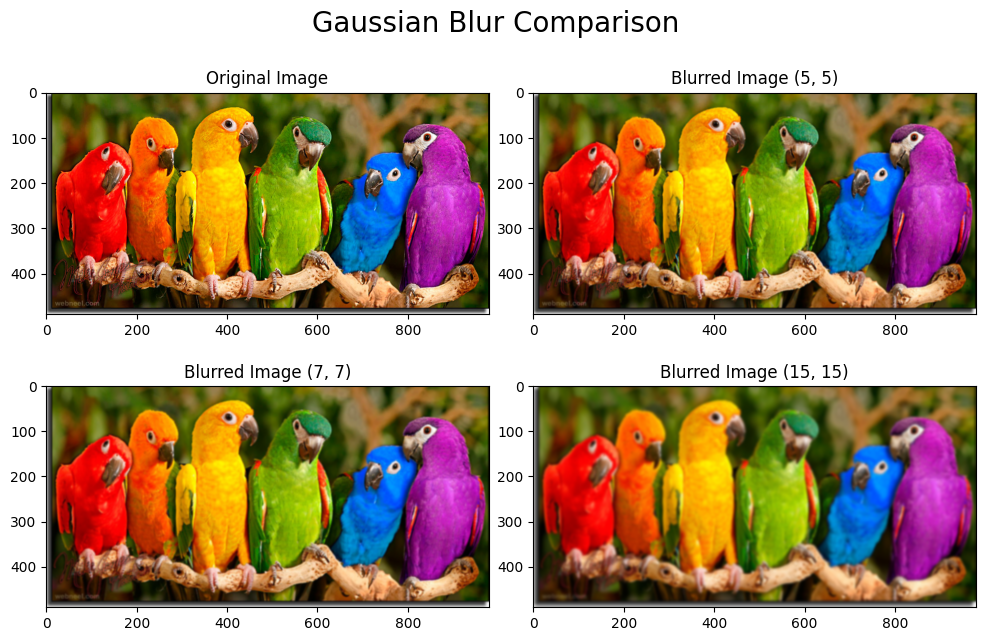

In [ ]:
# GAUSS BLUR
fig = plt.figure(figsize=(12, 8))
fig.suptitle("Gaussian Blur Comparison", fontsize=20)

# Display the original image
ax = fig.add_subplot(2, 2, 1)
ax.set_title("Original Image")
plt.imshow(img_bgr)

kernelSizes = [(5, 5), (7, 7), (15, 15)]

# Loop over the kernel sizes and display the blurred images
for i, (kX, kY) in enumerate(kernelSizes):
    # Apply Gaussian blur to the image using the current kernel size
    img_gaussblur = cv2.GaussianBlur(img_bgr, (kX, kY), 0)

    # Add a subplot for the blurred image
    ax = fig.add_subplot(2, 2, i + 2)
    ax.set_title("Blurred Image ({}, {})".format(kX, kY))
    plt.imshow(img_gaussblur)

# Adjust layout and display the plot
plt.subplots_adjust(wspace=0.1, hspace=-0.3, top=1)
plt.show()

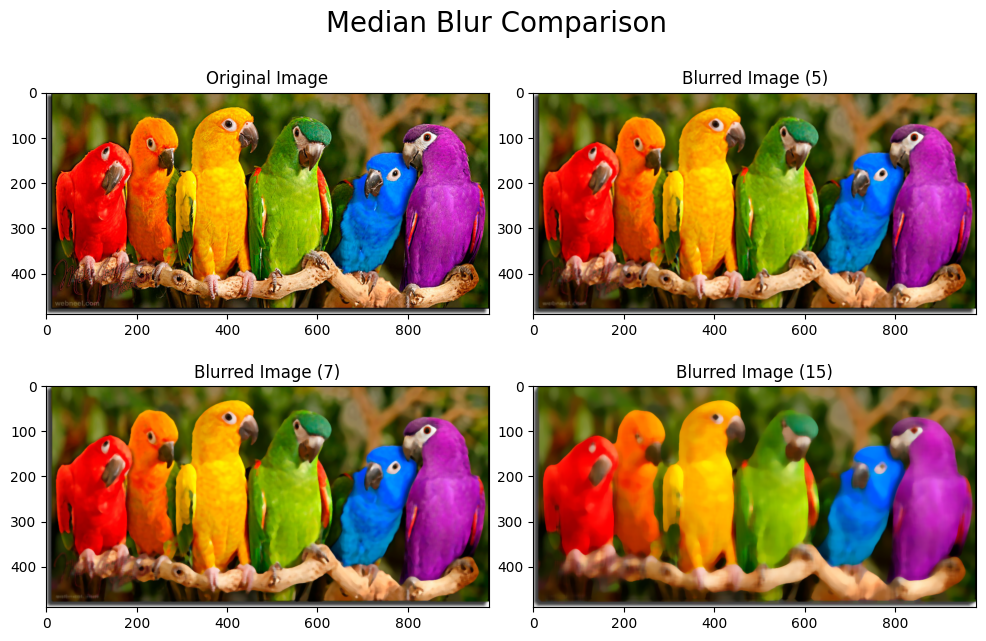

In [ ]:
## MEDIAN BLUR

fig = plt.figure(figsize=(12, 8))
fig.suptitle("Median Blur Comparison", fontsize=20)

ax = fig.add_subplot(2, 2, 1)
ax.set_title("Original Image")
plt.imshow(img_bgr)

kernel = [5,7,15]

# Loop over the kernel sizes and display the blurred images
for i, k in enumerate(kernel):
    # apply a "median" blur to the image
    img_medianblur = cv2.medianBlur(img_bgr, k)

    # Add a subplot for the blurred image
    ax = fig.add_subplot(2, 2, i+2)
    ax.set_title("Blurred Image ({})".format(k))
    plt.imshow(img_medianblur)

# Adjust layout and display the plot
plt.subplots_adjust(wspace=0.1, hspace=-0.3, top=1)
plt.show()

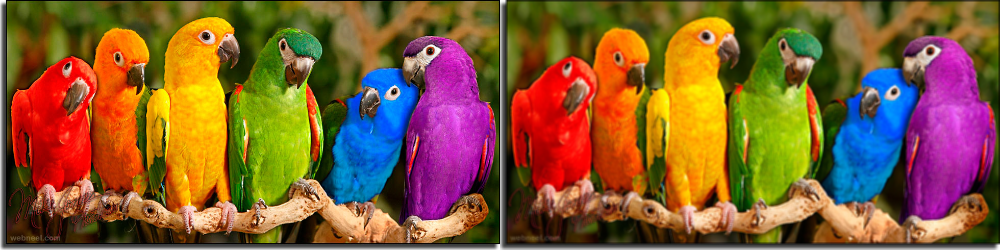

In [ ]:
# (a.1) Filter Blurring Kernel 5

# define kernel and normalization
kernel_5 = np.ones((5,5), np.float32) / 25
# apply convolution
img_kernel_5 = cv2.filter2D(img, -1, kernel_5)
# concatenate image horizontally
list_img_5 = np.hstack([img, img_kernel_5])
# display the concatenated image
cv2_imshow(list_img_5)

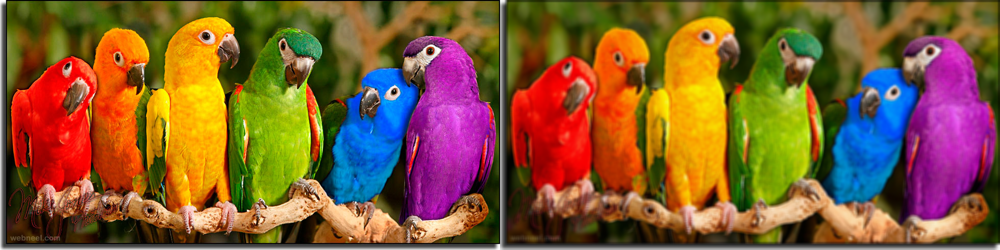

In [ ]:
# (a.2) Filter Blurring Kernel 7

# define kernel and normalization
kernel_7 = np.ones((7,7), np.float32) / 50
# apply convolution
img_kernel_7 = cv2.filter2D(img, -1, kernel_7)
# concatenate image horizontally
list_img_7 = np.hstack([img, img_kernel_7])
# display the concatenated image
cv2_imshow(list_img_7)

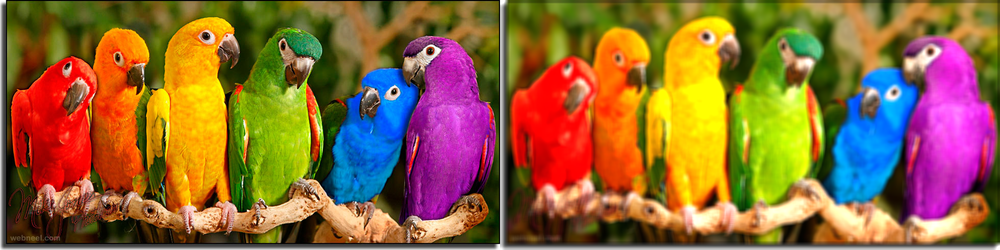

In [ ]:
# (a.3) Filter Blurring Kernel 10
# define kernel and normalization
kernel_10 = np.ones((10,10), np.float32) / 80
# apply convolution
img_kernel_10 = cv2.filter2D(img, -1, kernel_10)
# concatenate image horizontally
list_img_10 = np.hstack([img, img_kernel_10])
# display the concatenated image
cv2_imshow(list_img_10)

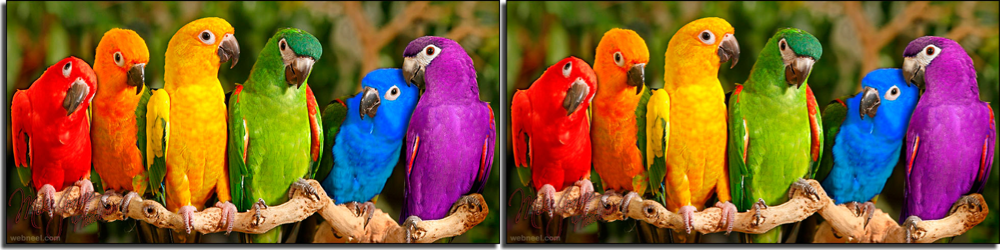

In [ ]:
# (b.0) Directional Blurring

img_2gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
# horizontal
kernel_hor = np.array([[0,0,0], [1,1,1], [0,0,0]], np.float32) / 3.0
# convolution
img_kernel_hor = cv2.filter2D(img, -1, kernel_hor)
# concatenate
list_img_pt3 = np.hstack([img, img_kernel_hor])
cv2_imshow(list_img_pt3)

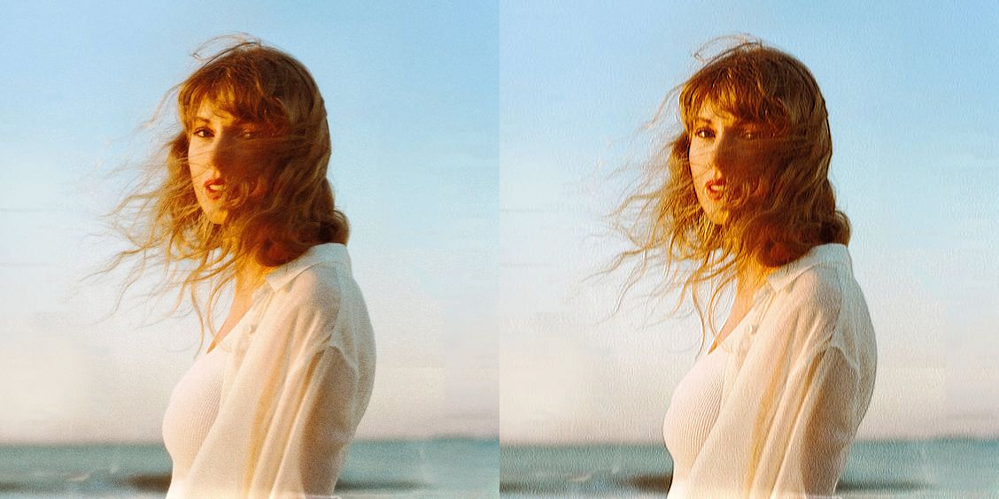

In [ ]:
# (b.2) Directional Blurring

img2 = cv2.imread('./taylor.jpg')

img_2gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
# horizontal
kernel_hor = np.array([[0,1,-1,0], [1,3,-3,1], [1,3,-3,1], [0,1,-1,0]], np.float32) / 4
# convolution
img_kernel_hor = cv2.filter2D(img2, -1, kernel_hor)
# concatenate
list_img_pt3 = np.hstack([img2, img_kernel_hor])
cv2_imshow(list_img_pt3)

## Sharpen

In [ ]:
# Sharpen

kernel_sharp_1 = np.array([[-1,-1,-1], [-1,9,-1], [-1,-1,-1]], np.float32)
kernel_sharp_2 = np.array([[1,1,1], [1,-7,1], [1,1,1]], np.float32)
# convolution
img_kernel_sharp_1 = cv2.filter2D(img, -1, kernel_sharp_1)
img_kernel_sharp_2 = cv2.filter2D(img, -1, kernel_sharp_2)
# concatenate
list_img_pt4 = np.hstack([img, img_kernel_sharp_1, img_kernel_sharp_2])
cv2_imshow(list_img_pt4)

Output hidden; open in https://colab.research.google.com to view.

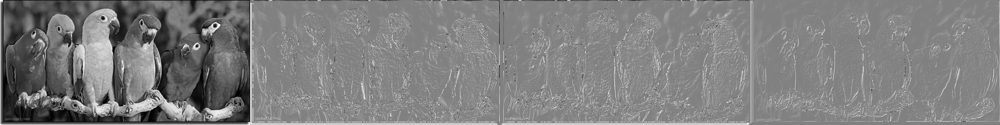

In [ ]:
# Emboss

kernel_emboss_1 = np.array([[0,-1,-1], [1,0,-1], [1,1,0]])
kernel_emboss_2 = np.array([[-1,-1,0], [-1,0,1], [0,1,1]])
kernel_emboss_3 = np.array([[1,0,0], [0,0,0], [0,0,-1]])
# convolution and offset to produce shadows
img_emboss_1 = cv2.filter2D(img_gray, -1, kernel_emboss_1) + 128
img_emboss_2 = cv2.filter2D(img_gray, -1, kernel_emboss_2) + 128
img_emboss_3 = cv2.filter2D(img_gray, -1, kernel_emboss_3) + 128
# concatenate
list_img_pt5 = np.hstack([img_gray, img_emboss_1, img_emboss_2, img_emboss_3])
cv2_imshow(list_img_pt5)